In [1]:
%pip install imageio
%pip install scipy
%pip install scikit-image
%pip install matplotlib
%pip install pillow



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


# Viet Chuong Trinh Xu Li Anh Co Ban

## 2.1 Nap anh su dung thu vien Python Image Library (PIL)

In [2]:
from PIL import Image
import numpy as np
img=Image.open("bird.png")
img.show()

## 2.2 Nap anh su dung lenh thu vien Imageio

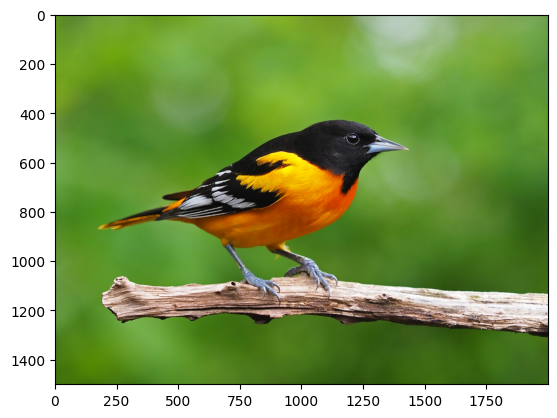

In [3]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('bird.png')
plt.imshow(data)
plt.show()

# 2.3 Do Phan Giai Anh

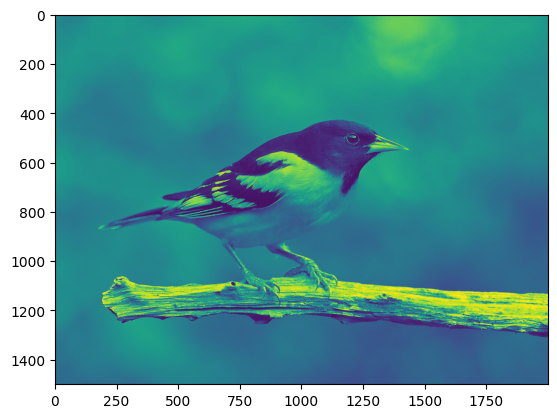

In [4]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('bird.png', mode='F')
plt.imshow(data)
plt.show()

## Anh Trang Den 

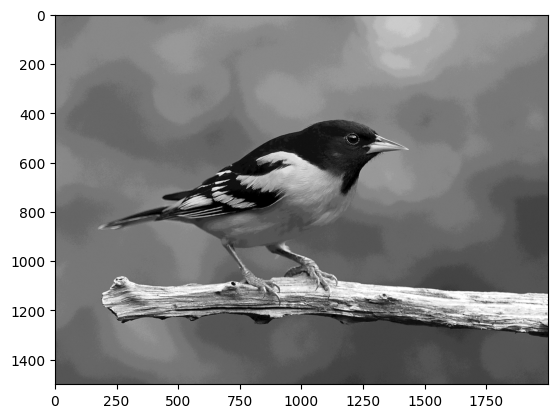

In [5]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('bird.png', mode = "F").astype(np.uint8)
cl = data & 0xF0
iio.imsave('birdf0.png', cl)
tmp = iio.imread('birdf0.png')
plt.imshow(tmp, cmap='gray')
plt.show()

## 2.4 Mau Sac voi he RGB 

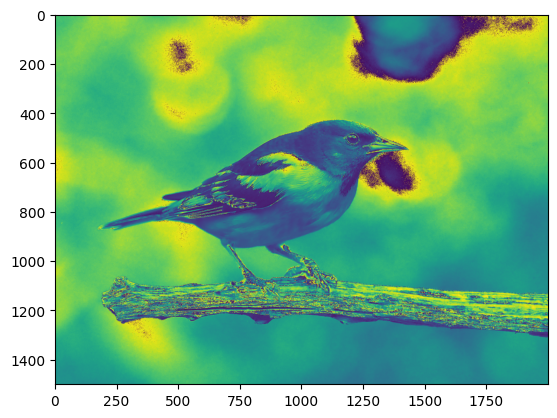

In [6]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('bird.png')
bdata=(data[:,:,1]+ data [:,:,2])
plt.imshow(bdata)
plt.show()

## 2.5 Mau sac voi he HSV

In [7]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import colorsys

a = colorsys.rgb_to_hsv(255, 0, 0)
print(a)

b = colorsys.rgb_to_hsv(1, 0, 0)
print(b)

c = colorsys.rgb_to_hsv(0, 255, 0)
print(c)

d = colorsys.hsv_to_rgb(1, 1, 255)
print(d)

(0.0, 1.0, 255)
(0.0, 1.0, 1)
(0.3333333333333333, 1.0, 255)
(255, 0.0, 0.0)


## 2.6 Ung dung chuyen doi he mau 

In [8]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import colorsys

data = iio.imread('bird.png')
rgb2hsv = np.vectorize(colorsys.rgb_to_hsv)
rgb = data[:, :, :3]
hsv = rgb2hsv(rgb[:, :, 0], rgb[:, :, 1], rgb[:, :, 2])

rgb2 = np.vectorize(colorsys.hsv_to_rgb)(hsv[0], hsv[1], hsv[2])
result = np.array(rgb2).transpose(1, 2, 0)

## 2.7 Loc Anh

Loc anh voi mean filter

In [9]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
data = iio.imread('bird.png', mode="F")

# initializing the filter of size 5 by 5
# the filter is divided by 25 for normalization
k = np.ones((5, 5)) / 25

# performing convolution
b = sn.convolve(data, k).astype(np.uint8)
iio.imsave('bird_mean_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.show()

[[119 119 119 ... 132 131 131]
 [119 119 119 ... 131 131 131]
 [120 120 119 ... 132 132 131]
 ...
 [ 89  89  89 ...  80  80  80]
 [ 89  89  89 ...  80  80  80]
 [ 90  89  89 ...  80  80  80]]


Loc anh voi median filter

[[118 118 118 ... 131 131 131]
 [118 118 119 ... 131 131 131]
 [119 119 119 ... 132 131 131]
 ...
 [ 89  88  88 ...  81  81  81]
 [ 89  88  88 ...  80  81  81]
 [ 89  88  89 ...  80  80  81]]


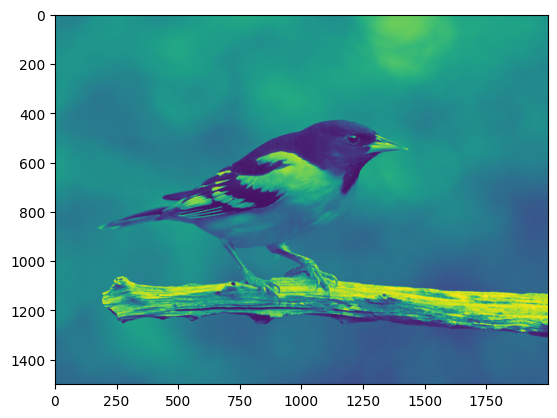

In [10]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
data = iio.imread('bird.png', mode="F").astype(np.uint8)

# performing median filter
# footprint: a boolean array of the same dimension of image.
# The pixels in the input image corresponding to the points of the footprint with true values are considered for filtering
b = sn.median_filter(data, size=5, footprint=None, mode='reflect', cval=0.0, output=None)
iio.imsave('bird_median_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()

Loc anh voi Max Filter

[[121 121 121 ... 138 138 138]
 [128 128 128 ... 138 138 138]
 [128 128 128 ... 138 138 138]
 ...
 [ 96  96  96 ...  83  83  83]
 [ 96  96  96 ...  83  83  83]
 [ 96  96  96 ...  83  83  83]]


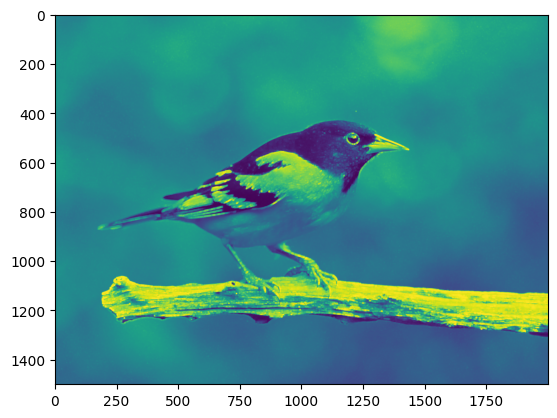

In [11]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
data = iio.imread('bird.png', mode="F").astype(np.uint8)

# performing maximum filter
# size = 5
# footprint: a boolean array of the same dimension of image.
# The pixels in the input image corresponding to the points of the footprint with true values are considered for filtering
b = sn.maximum_filter(data, size=5, footprint=None, mode='reflect', cval=0.0, output=None)
iio.imsave('bird_max_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()

Loc anh voi Min Filter

[[117 117 117 ... 127 127 127]
 [113 113 113 ... 127 127 127]
 [113 113 113 ... 127 127 127]
 ...
 [ 85  85  85 ...  76  76  76]
 [ 85  85  85 ...  76  76  76]
 [ 85  85  85 ...  78  78  78]]


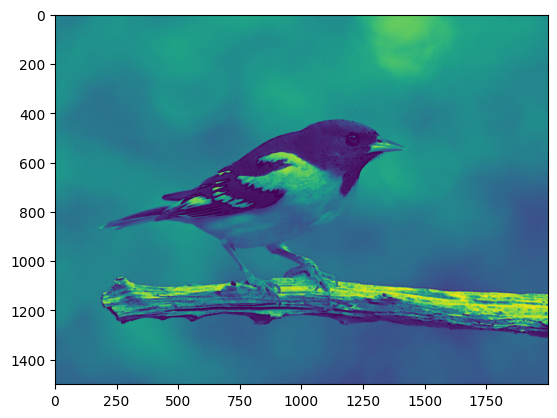

In [12]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
data = iio.imread('bird.png', mode="F").astype(np.uint8)

# performing minimum filter
# size = 5: convolution
# footprint: a boolean array of the same dimension of image.
# The pixels in the input image corresponding to the points of the footprint with true values are considered for filtering
b = sn.minimum_filter(data, size=5, footprint=None, output=None, mode='reflect', cval=0.0)
iio.imsave('bird_min_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()

## 2.8 Do canh bien cua anh

Do canh bien cua anh bang Sobel Filter

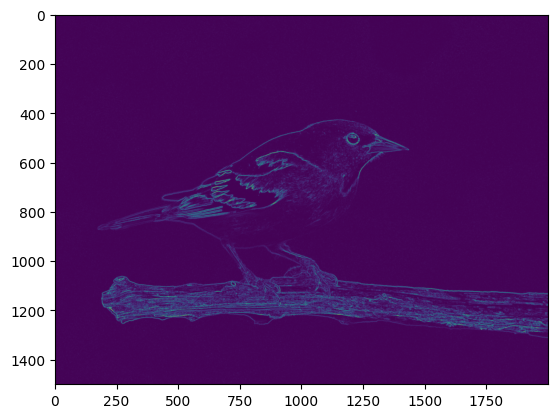

In [13]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
from skimage import filters
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode="F")
b = filters.sobel(a).astype(np.uint8)
iio.imsave('bird_sobel_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()


Do canh bien cua anh bang Prewitt Filter

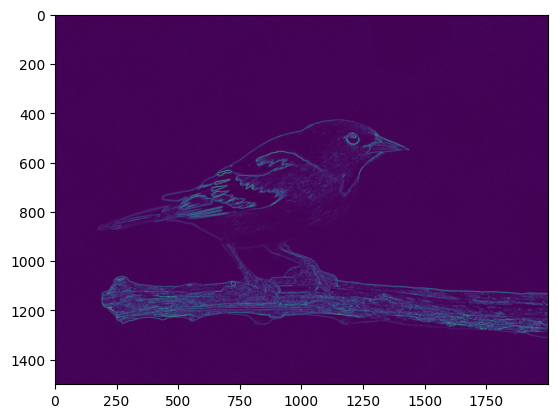

In [14]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
from skimage import filters
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode="F")
b = filters.prewitt(a).astype(np.uint8)
iio.imsave('bird_sobel_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()

Do canh bien cua anh bang Canny Filter

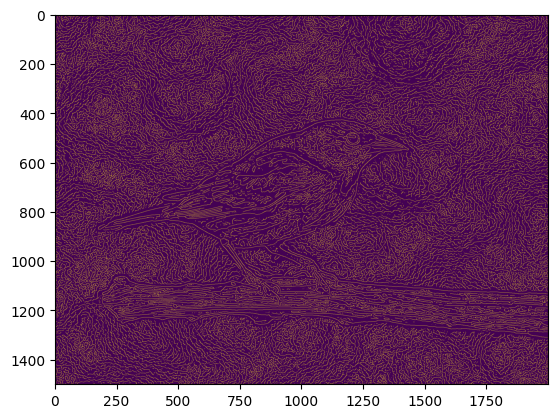

In [15]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
from skimage import feature
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode="F")
b = feature.canny(a,sigma=3).astype(np.uint8)
iio.imsave('bird_sobel_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()

Xac dinh bien doi tuong su dung Second Derivative

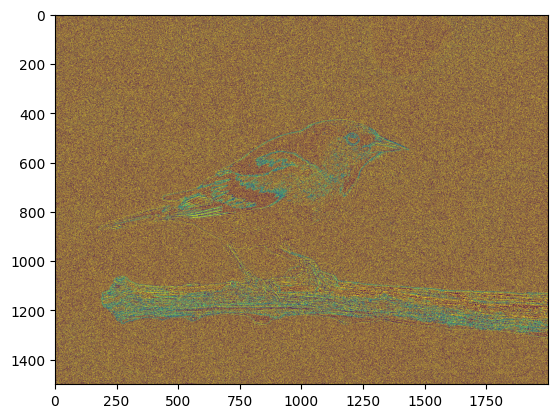

In [16]:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
from skimage import filters
import matplotlib.pyplot as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode="F")
b = sn.laplace(a,mode="reflect").astype(np.uint8)
iio.imsave('bird_sobel_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()

# Bai Tap

## Bai tap 1

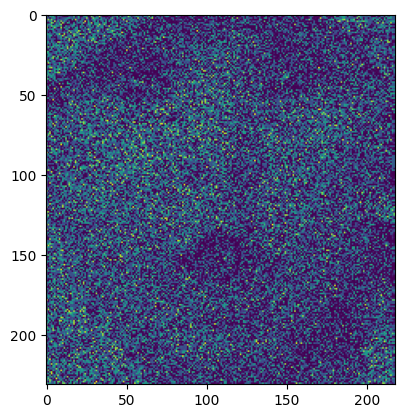

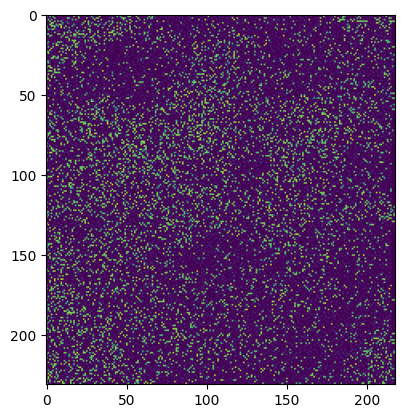

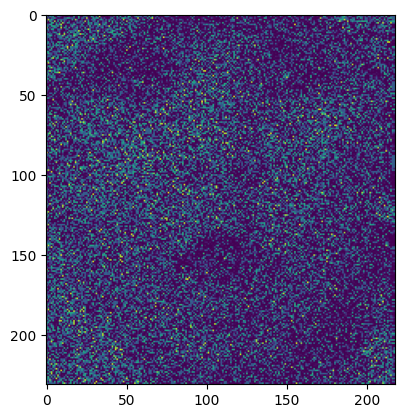

In [17]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('exercise/baby.jpeg', mode = "F").astype(np.uint8)
cl = data & 0xf0
iio.imsave('babyf0.jpeg', cl)
tmp = iio.imread('babyf0.jpeg')
plt.imshow(tmp)
plt.show()
cl = data & 0x80
iio.imsave('babyf2.jpeg', cl)
tmp = iio.imread('babyf2.jpeg')
plt.imshow(tmp)
plt.show()
cl = data & 0xC0
iio.imsave('babyc0.jpeg', cl)
tmp = iio.imread('babyc0.jpeg')
plt.imshow(tmp)
plt.show()

# Bai Tap 2

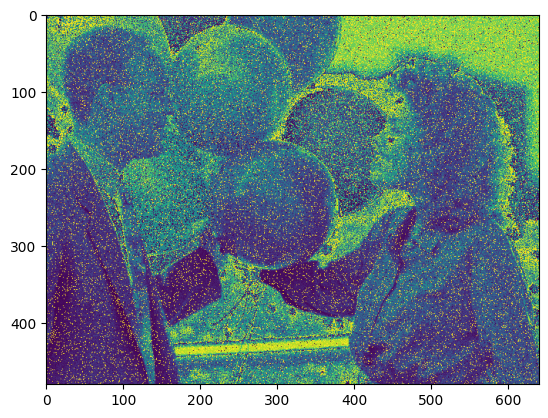

In [18]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('exercise/balloons_noisy.png')
bdata=(data[:,:,1]+ data [:,:,2])
iio.imsave('balloons_noisyf0.png',bdata)
plt.imshow(bdata)
plt.show()

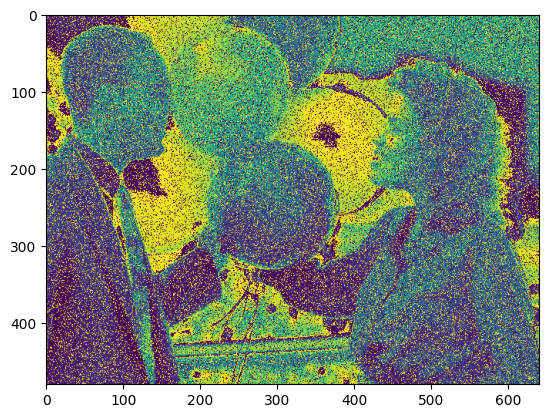

In [19]:
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
data = iio.imread('exercise/balloons_noisy.png')
bdata=(data[:,:,1]+ data [:,:,1])
iio.imsave('balloons_noisyf1.png',bdata)
plt.imshow(bdata)
plt.show()

## Bai Tap 5: Viet chuong trinh  su dung mean filter cho cac hinh trong muc 


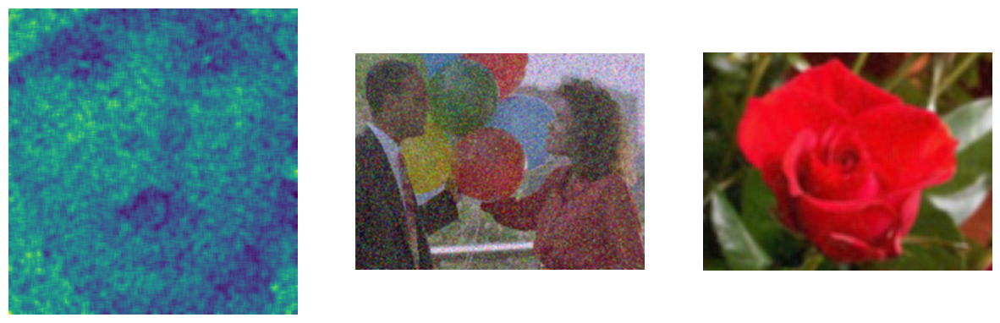

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Hàm để áp dụng mean filter
def apply_mean_filter(image):
    kernel_size = 5
    pad_size = kernel_size // 2
    # Kiểm tra hình ảnh có 3 kênh màu hay không
    if image.ndim == 3:  # Nếu là ảnh màu
        padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='edge')
        filtered_image = np.zeros_like(image)

        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                filtered_image[i, j] = np.mean(padded_image[i:i + kernel_size, j:j + kernel_size], axis=(0, 1))
    else:  # Nếu là ảnh xám
        padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size)), mode='edge')
        filtered_image = np.zeros_like(image)

        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                filtered_image[i, j] = np.mean(padded_image[i:i + kernel_size, j:j + kernel_size])
    
    return filtered_image

# Tải và xử lý hình ảnh
image_paths = ["exercise/baby.jpeg",  
    "exercise/balloons_noisy.png",
    "exercise/flower.jpeg"] # Thay bằng đường dẫn hình ảnh của bạn
filtered_images = []

for path in image_paths:
    img = np.array(Image.open(path))
    filtered_img = apply_mean_filter(img)
    filtered_images.append(filtered_img)

# Hiển thị kết quả
plt.figure(figsize=(15, 5))
for i, filtered_image in enumerate(filtered_images):
    plt.subplot(1, len(filtered_images), i + 1)
    plt.imshow(filtered_image.astype(np.uint8))
    plt.axis('off')
plt.show()

Bai Tap 6: Viet chuong trinh su dung cac filter khu nhieu da thuc hanh cho cac hinh trong thu muc exercise . cho biet chuong trinh nao khu nhieu tot nhat

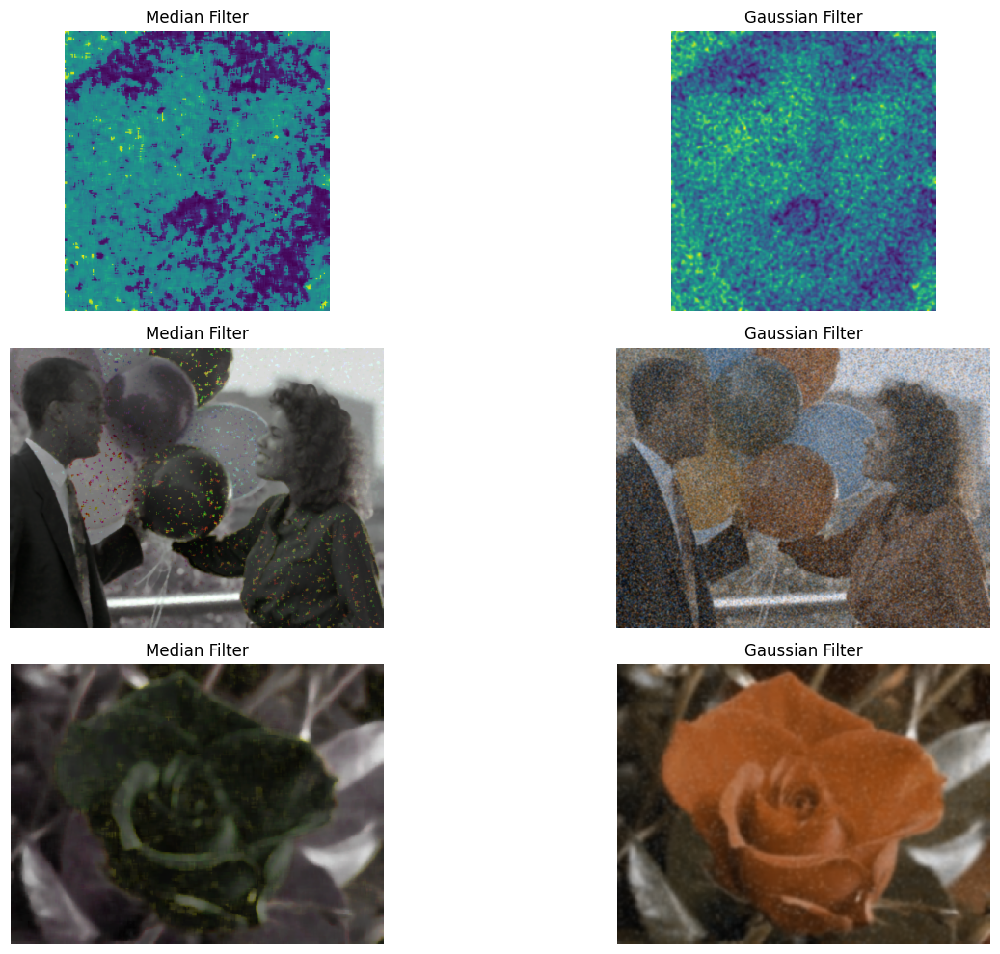

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import gaussian_filter, median_filter

# Hàm để áp dụng các bộ lọc
def apply_filters(image):
    # Bộ lọc Mean (sử dụng np.mean không đúng như trước)
    mean_filtered = np.mean(image)  # Chỉ để so sánh
    median_filtered = median_filter(image, size=5)
    gaussian_filtered = gaussian_filter(image, sigma=1)

    return median_filtered, gaussian_filtered

# Tải và xử lý hình ảnh
image_paths = ["exercise/baby.jpeg",  
    "exercise/balloons_noisy.png",
    "exercise/flower.jpeg"] # Thay bằng đường dẫn hình ảnh của bạn
filtered_images = []

for path in image_paths:
    img = np.array(Image.open(path))
    median_img, gaussian_img = apply_filters(img)
    filtered_images.append((median_img, gaussian_img))

# Hiển thị kết quả
plt.figure(figsize=(15, 10))
for i, (median_img, gaussian_img) in enumerate(filtered_images):
    plt.subplot(len(filtered_images), 2, i * 2 + 1)
    plt.imshow(median_img.astype(np.uint8))
    plt.title('Median Filter')
    plt.axis('off')

    plt.subplot(len(filtered_images), 2, i * 2 + 2)
    plt.imshow(gaussian_img.astype(np.uint8))
    plt.title('Gaussian Filter')
    plt.axis('off')

plt.tight_layout()
plt.show()

Giải thích:

Bộ lọc Mean: Tính trung bình các pixel. (Ở đây chỉ để so sánh, không khử nhiễu tốt).

Bộ lọc Median: Làm mượt ảnh bằng cách thay thế mỗi pixel bằng giá trị trung vị của các pixel lân cận.

Bộ lọc Gaussian: Sử dụng hàm Gaussian để làm mờ ảnh.

So sánh kết quả:

Bộ lọc Median thường khử nhiễu tốt hơn trong trường hợp ảnh có nhiễu muối và tiêu.

Bộ lọc Gaussian hiệu quả cho các loại nhiễu khác và giữ lại các chi tiết hình ảnh tốt hơn.

Bai tap 7: Viet chuong trinh su dung cac filter xac dinh bien cua cac hinh trong exercise . Luu cac hinh vao may ( khu nhieu truoc khi xac dinh bien)

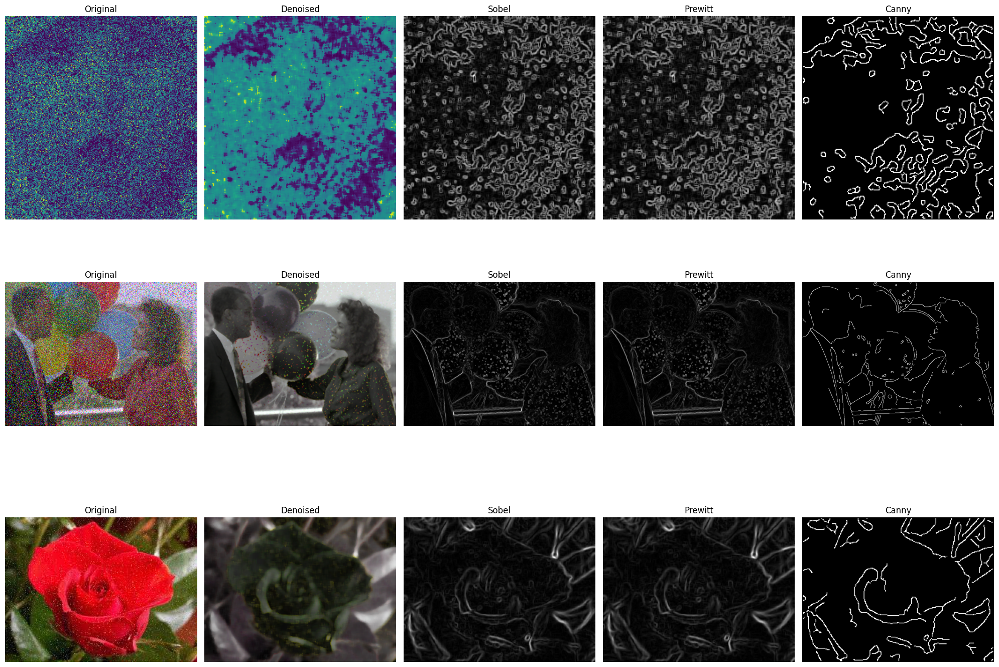

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import median_filter
from skimage import filters, feature
import os

def detect_edges(image_path, save_path):
    # Đọc ảnh
    img = np.array(Image.open(image_path))
    
    # Khử nhiễu bằng bộ lọc median
    denoised_img = median_filter(img, size=5)
    
    # Lưu ảnh đã khử nhiễu
    Image.fromarray(denoised_img).save(os.path.join(save_path, f'denoised_{os.path.basename(image_path)}'))
    
    # Chuyển đổi ảnh màu sang ảnh xám nếu cần
    if denoised_img.ndim == 3:
        gray_img = np.mean(denoised_img, axis=2).astype(np.uint8)
    else:
        gray_img = denoised_img

    # Áp dụng các bộ lọc phát hiện biên
    sobel_edges = filters.sobel(gray_img)
    prewitt_edges = filters.prewitt(gray_img)
    canny_edges = feature.canny(gray_img, sigma=2)

    # Chuẩn hóa kết quả về dải [0, 255]
    sobel_edges = (sobel_edges / sobel_edges.max() * 255).astype(np.uint8)
    prewitt_edges = (prewitt_edges / prewitt_edges.max() * 255).astype(np.uint8)
    canny_edges = (canny_edges * 255).astype(np.uint8)

    # Lưu các ảnh biên
    Image.fromarray(sobel_edges).save(os.path.join(save_path, f'sobel_{os.path.basename(image_path)}'))
    Image.fromarray(prewitt_edges).save(os.path.join(save_path, f'prewitt_{os.path.basename(image_path)}'))
    Image.fromarray(canny_edges).save(os.path.join(save_path, f'canny_{os.path.basename(image_path)}'))
    
    return denoised_img, sobel_edges, prewitt_edges, canny_edges

# Tạo thư mục lưu kết quả
save_path = 'output'
os.makedirs(save_path, exist_ok=True)

# Danh sách ảnh cần xử lý
image_paths = [
    "exercise/baby.jpeg",
    "exercise/balloons_noisy.png",
    "exercise/flower.jpeg"
]

# Xử lý và hiển thị kết quả
plt.figure(figsize=(20, 15))
for idx, image_path in enumerate(image_paths):
    denoised, sobel, prewitt, canny = detect_edges(image_path, save_path)
    
    # Hiển thị ảnh gốc và kết quả
    plt.subplot(len(image_paths), 5, idx*5 + 1)
    plt.imshow(Image.open(image_path))
    plt.title('Original')
    plt.axis('off')
    
    plt.subplot(len(image_paths), 5, idx*5 + 2)
    plt.imshow(denoised)
    plt.title('Denoised')
    plt.axis('off')
    
    plt.subplot(len(image_paths), 5, idx*5 + 3)
    plt.imshow(sobel, cmap='gray')
    plt.title('Sobel')
    plt.axis('off')
    
    plt.subplot(len(image_paths), 5, idx*5 + 4)
    plt.imshow(prewitt, cmap='gray')
    plt.title('Prewitt')
    plt.axis('off')
    
    plt.subplot(len(image_paths), 5, idx*5 + 5)
    plt.imshow(canny, cmap='gray')
    plt.title('Canny')
    plt.axis('off')

plt.tight_layout()
plt.show()

Bai tap 8: Viet chuong trinh doi mau RGB ngau nhien cua cac hinh trong thu muc Exercise. Luu hinh moi vao may (Khu nhieu truoc khi doi mau)

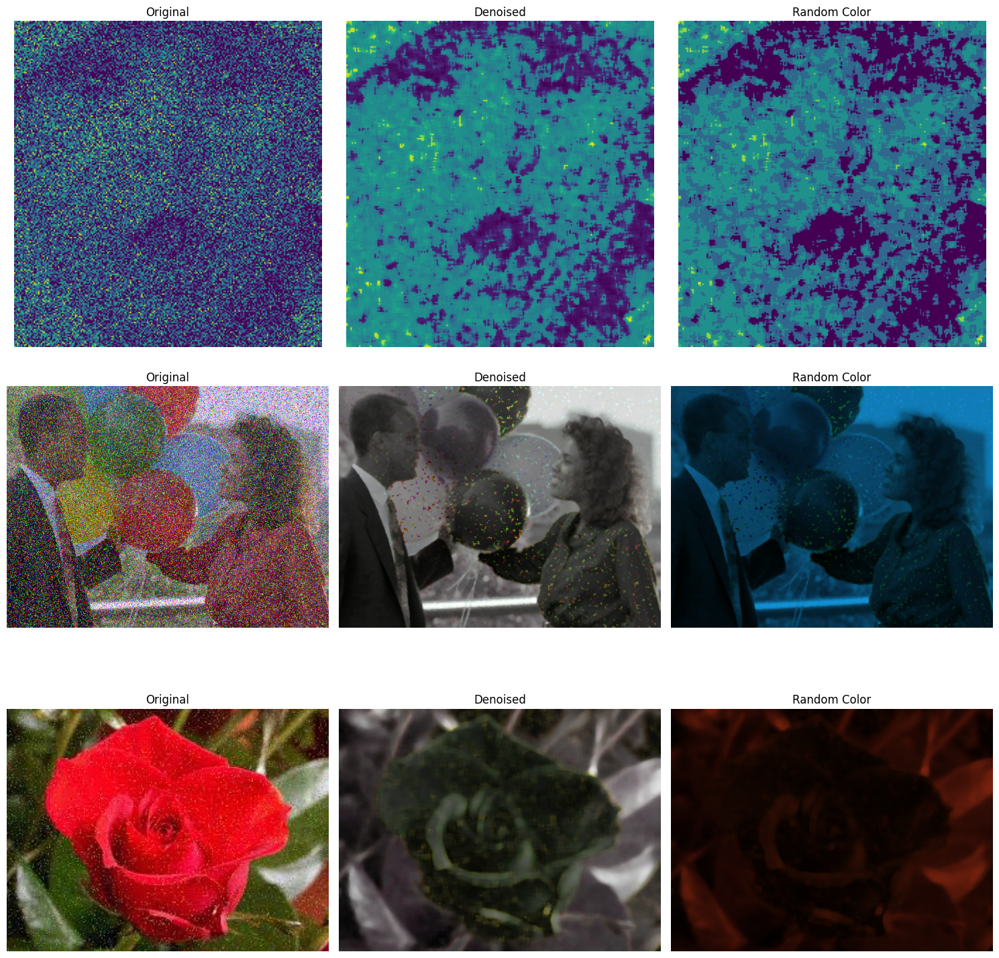

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import median_filter
import os

def random_color_change(image_path, save_path):
    # Đọc ảnh
    img = np.array(Image.open(image_path))
    
    # Khử nhiễu bằng bộ lọc median
    denoised_img = median_filter(img, size=5)
    
    # Tạo ma trận ngẫu nhiên cho mỗi kênh màu
    if denoised_img.ndim == 3:  # Ảnh màu
        # Tạo ma trận ngẫu nhiên [0-1] cho mỗi kênh màu
        random_r = np.random.rand()
        random_g = np.random.rand()
        random_b = np.random.rand()
        
        # Thay đổi cường độ màu
        modified_img = denoised_img.copy()
        modified_img[:,:,0] = (modified_img[:,:,0] * random_r).astype(np.uint8)  # Red
        modified_img[:,:,1] = (modified_img[:,:,1] * random_g).astype(np.uint8)  # Green
        modified_img[:,:,2] = (modified_img[:,:,2] * random_b).astype(np.uint8)  # Blue
    else:  # Ảnh xám
        random_intensity = np.random.rand()
        modified_img = (denoised_img * random_intensity).astype(np.uint8)
    
    # Lưu hình ảnh đã xử lý
    Image.fromarray(denoised_img).save(os.path.join(save_path, f'denoised_{os.path.basename(image_path)}'))
    Image.fromarray(modified_img).save(os.path.join(save_path, f'random_color_{os.path.basename(image_path)}'))
    
    return denoised_img, modified_img

# Tạo thư mục lưu kết quả
save_path = 'output'
os.makedirs(save_path, exist_ok=True)

# Danh sách ảnh cần xử lý
image_paths = [
    "exercise/baby.jpeg",
    "exercise/balloons_noisy.png",
    "exercise/flower.jpeg"
]

# Xử lý và hiển thị kết quả
plt.figure(figsize=(15, len(image_paths) * 5))

for idx, image_path in enumerate(image_paths):
    denoised_img, modified_img = random_color_change(image_path, save_path)
    
    # Hiển thị ảnh gốc
    plt.subplot(len(image_paths), 3, idx * 3 + 1)
    plt.imshow(Image.open(image_path))
    plt.title('Original')
    plt.axis('off')
    
    # Hiển thị ảnh đã khử nhiễu
    plt.subplot(len(image_paths), 3, idx * 3 + 2)
    plt.imshow(denoised_img)
    plt.title('Denoised')
    plt.axis('off')
    
    # Hiển thị ảnh đã đổi màu
    plt.subplot(len(image_paths), 3, idx * 3 + 3)
    plt.imshow(modified_img)
    plt.title('Random Color')
    plt.axis('off')

plt.tight_layout()
plt.show()

Giải thích code:

1. Quy trình xử lý:
   - Đọc ảnh và chuyển thành mảng numpy
   - Khử nhiễu bằng bộ lọc median
   - Tạo các hệ số ngẫu nhiên cho mỗi kênh màu RGB
   - Nhân các kênh màu với hệ số ngẫu nhiên tương ứng
   - Lưu ảnh gốc, ảnh đã khử nhiễu và ảnh đã đổi màu

2. Xử lý màu:
   - Với ảnh màu (3 kênh): Tạo 3 hệ số ngẫu nhiên cho R,G,B
   - Với ảnh xám (1 kênh): Tạo 1 hệ số ngẫu nhiên cho cường độ sáng

3. Kết quả:
   - Ảnh gốc
   - Ảnh sau khi khử nhiễu
   - Ảnh sau khi đổi màu ngẫu nhiên

bài 9: Viết chương trình đổi màu HSV ngẫu nhiên nhưng không trùng của các hình trong thư mục Exercise. Lưu hình mới vào máy. (Khử nhiễu trước khi đổi màu)

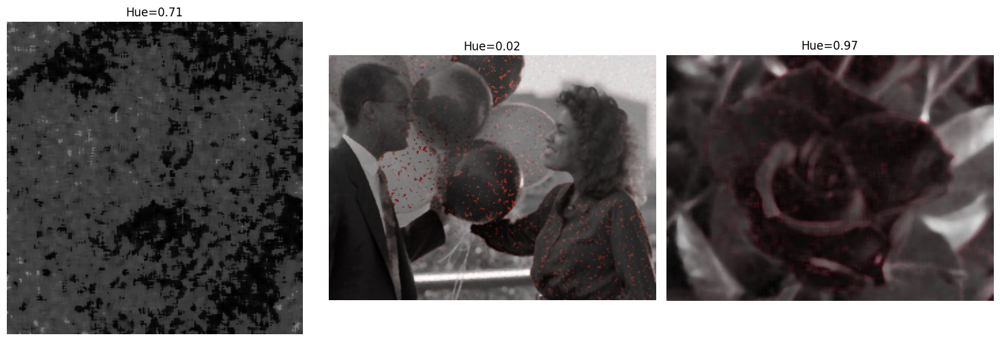

In [38]:
import colorsys

def random_unique_hsv_colorize(image, used_hues):
    # Chuyển ảnh sang float và scale về [0,1]
    img = image.astype(np.float32) / 255.0

    # Nếu ảnh là 2D (grayscale), chuyển thành 3D (giả lập RGB)
    if img.ndim == 2:
        img_rgb = np.stack([img]*3, axis=-1)
    else:
        img_rgb = img

    hsv_img = np.zeros_like(img_rgb)
    for i in range(img_rgb.shape[0]):
        for j in range(img_rgb.shape[1]):
            pixel = img_rgb[i, j]
            h, s, v = colorsys.rgb_to_hsv(float(pixel[0]), float(pixel[1]), float(pixel[2]))
            hsv_img[i, j, 0] = h
            hsv_img[i, j, 1] = s
            hsv_img[i, j, 2] = v

    # Sinh giá trị hue ngẫu nhiên không trùng
    while True:
        random_h = np.random.rand()
        if all(abs(random_h - h) > 0.05 for h in used_hues):
            break
    used_hues.append(random_h)
    # Thay đổi hue, giữ nguyên s,v
    hsv_img[..., 0] = random_h

    # Chuyển HSV về RGB
    rgb_img = np.zeros_like(img_rgb)
    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            h, s, v = hsv_img[i, j]
            r, g, b = colorsys.hsv_to_rgb(float(h), float(s), float(v))
            rgb_img[i, j, 0] = r
            rgb_img[i, j, 1] = g
            rgb_img[i, j, 2] = b
    rgb_img = (rgb_img * 255).astype(np.uint8)
    return rgb_img, random_h

# Sử dụng biến image_paths đã có, không cần định nghĩa lại
# Sử dụng thư mục save_path đã có

used_hues = []
plt.figure(figsize=(15, 5))
for idx, image_path in enumerate(image_paths):
    # Đọc và khử nhiễu
    img = np.array(Image.open(image_path))
    denoised = median_filter(img, size=5)
    # Đổi màu HSV ngẫu nhiên không trùng
    hsv_img, hue = random_unique_hsv_colorize(denoised, used_hues)
    # Lưu ảnh
    Image.fromarray(hsv_img).save(os.path.join(save_path, f"hsv_random_{os.path.basename(image_path)}"))
    # Hiển thị
    plt.subplot(1, len(image_paths), idx+1)
    plt.imshow(hsv_img)
    plt.title(f"Hue={hue:.2f}")
    plt.axis('off')
plt.tight_layout()
plt.show()